# Marketing Campaign Analytics — EDA Notebook

**Dataset:** `marketing_campaign_data.csv` — 56,000 customer records across 8 countries  
**Objective:** Clean, explore, and segment customer data to answer key business questions about campaign response, spending behaviour, and channel preference.

---
**Notebook Sections:**
1. Data Loading
2. Data Preparation (Missing Values, Duplicates)
3. Feature Engineering
4. Summary Statistics
5. Outlier Detection & Removal
6. Rule-Based Segmentation
7. Univariate EDA
8. Bivariate EDA
9. MySQL Export


## 1. Data Loading

### 1.1 Import Libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings as wr
wr.filterwarnings('ignore')

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.express as px

from datetime import datetime
import missingno as msno

import os
from dotenv import load_dotenv

load_dotenv()

True

### 1.2 Dataset Information

**`marketing_campaign_data.csv`** — Main dataset with customer-level information:
- Demographics (Age, Income, Education, Marital Status, Country)
- Spending across 6 product categories over the last 2 years
- Purchase channel behaviour (Web, Store, Catalog, Deals)
- Campaign acceptance flags for 5 campaigns + last campaign response

**`marketing_data_dictionary.csv`** — Field names and descriptions for every column.

In [4]:
data_directory = os.getenv("MY_DATA_DIR")
file_path_data = os.path.join(data_directory, "marketing_campaign_data.csv")
file_path_dictionary = os.path.join(data_directory,"marketing_data_dictionary.csv")

In [5]:
# NOTE: Update these paths to match your local file locations
df = pd.read_csv(file_path_data)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,342199,1985,Graduation,Together,59011.7,1,0,2012-11-17,3,0,...,3,4,0,0,0,0,0,0,0,Spain
1,8075450,1975,Master,Single,1730.0,1,1,2013-04-10,96,0,...,2,3,0,0,0,0,0,0,0,Spain
2,13664263,1978,Graduation,Married,98584.6,0,0,2014-01-11,99,920,...,6,3,0,0,0,0,0,0,0,Australia
3,16164787,1976,Graduation,Married,74031.5,1,0,2014-06-18,47,265,...,11,4,0,0,0,0,0,0,0,Spain
4,15815139,1981,Graduation,Divorced,52784.2,1,1,2014-05-20,0,30,...,3,6,0,0,0,0,0,0,0,Canada
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55995,2485439,1985,Graduation,Married,32533.4,0,0,2013-04-05,99,8,...,6,8,0,0,0,0,0,0,0,Australia
55996,9202496,1992,Basic,Single,70496.3,0,1,2013-01-31,9,835,...,8,4,0,0,0,0,0,0,0,Germany
55997,14677746,1950,Graduation,Together,21072.0,1,0,2013-06-25,24,0,...,0,3,0,0,0,0,0,1,0,Saudi Arabia
55998,3843719,1976,Graduation,Together,64218.1,0,0,2014-05-12,81,8,...,1,8,0,0,0,0,0,0,0,Saudi Arabia


In [6]:
dd = pd.read_csv(file_path_dictionary)
print(dd.to_string())

                  Field                                                         Description
0                    ID                                        Customer's unique identifier
1            Year_Birth                                               Customer's birth year
2             Education                                          Customer's education level
3        Marital_Status                                           Customer's marital status
4               Income                                   Customer's yearly household income
5               Kidhome                          Number of children in customer's household
6              Teenhome                         Number of teenagers in customer's household
7           Dt_Customer                      Date of customer's enrollment with the company
8               Recency                       Number of days since customer's last purchase
9              MntWines                            Amount spent on wine in the l

In [7]:
print("Shape of the dataframe:", df.shape)

Shape of the dataframe: (56000, 28)


In [8]:
print("\nFirst 5 rows of the dataframe:")
df.head()


First 5 rows of the dataframe:


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
0,342199,1985,Graduation,Together,59011.7,1,0,2012-11-17,3,0,...,3,4,0,0,0,0,0,0,0,Spain
1,8075450,1975,Master,Single,1730.0,1,1,2013-04-10,96,0,...,2,3,0,0,0,0,0,0,0,Spain
2,13664263,1978,Graduation,Married,98584.6,0,0,2014-01-11,99,920,...,6,3,0,0,0,0,0,0,0,Australia
3,16164787,1976,Graduation,Married,74031.5,1,0,2014-06-18,47,265,...,11,4,0,0,0,0,0,0,0,Spain
4,15815139,1981,Graduation,Divorced,52784.2,1,1,2014-05-20,0,30,...,3,6,0,0,0,0,0,0,0,Canada


In [9]:
print("\nLast 5 rows of the dataframe:")
df.tail()


Last 5 rows of the dataframe:


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
55995,2485439,1985,Graduation,Married,32533.4,0,0,2013-04-05,99,8,...,6,8,0,0,0,0,0,0,0,Australia
55996,9202496,1992,Basic,Single,70496.3,0,1,2013-01-31,9,835,...,8,4,0,0,0,0,0,0,0,Germany
55997,14677746,1950,Graduation,Together,21072.0,1,0,2013-06-25,24,0,...,0,3,0,0,0,0,0,1,0,Saudi Arabia
55998,3843719,1976,Graduation,Together,64218.1,0,0,2014-05-12,81,8,...,1,8,0,0,0,0,0,0,0,Saudi Arabia
55999,3195751,1984,Graduation,Married,89322.8,0,1,2013-09-04,93,113,...,1,4,0,0,0,0,0,0,0,Saudi Arabia


In [10]:
print("\nDataframe info — column names, non-null counts, and data types:")
print(df.info())


Dataframe info — column names, non-null counts, and data types:
<class 'pandas.DataFrame'>
RangeIndex: 56000 entries, 0 to 55999
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   56000 non-null  int64  
 1   Year_Birth           56000 non-null  int64  
 2   Education            56000 non-null  str    
 3   Marital_Status       56000 non-null  str    
 4   Income               56000 non-null  float64
 5   Kidhome              56000 non-null  int64  
 6   Teenhome             56000 non-null  int64  
 7   Dt_Customer          56000 non-null  str    
 8   Recency              56000 non-null  int64  
 9   MntWines             56000 non-null  int64  
 10  MntFruits            56000 non-null  int64  
 11  MntMeatProducts      56000 non-null  int64  
 12  MntFishProducts      56000 non-null  int64  
 13  MntSweetProducts     56000 non-null  int64  
 14  MntGoldProds         56000 non-n

In [11]:
print("\nSummary statistics of numeric columns:")
df.describe()


Summary statistics of numeric columns:


,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
count,5.600000e+04,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,...,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000,56000.000000
mean,8.389352e+06,1971.666696,57252.189521,0.539911,0.362143,63.221107,246.981482,16.152661,268.294018,51.097732,...,2.110750,4.706411,5.170107,0.062393,0.056821,0.045661,0.134446,0.014411,0.147589,0.007625
std,4.844638e+06,12.211066,34307.247999,0.521349,0.510567,31.157066,358.569481,33.931463,342.165712,73.226860,...,2.357824,2.896366,2.555911,0.241870,0.231503,0.208750,0.341134,0.119178,0.354696,0.086988
min,3.600000e+01,1936.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.187372e+06,1963.000000,28252.025000,0.000000,0.000000,35.000000,0.000000,0.000000,42.000000,3.000000,...,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8.383784e+06,1973.000000,58838.550000,1.000000,0.000000,71.000000,64.000000,0.000000,107.000000,13.000000,...,1.000000,4.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.258576e+07,1981.000000,86930.650000,1.000000,1.000000,93.000000,353.000000,15.000000,363.000000,71.000000,...,3.000000,6.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.677716e+07,1996.000000,258027.500000,2.000000,2.000000,99.000000,1493.000000,199.000000,1341.000000,259.000000,...,14.000000,13.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [12]:
print("\nData type of each column:")
print(df.dtypes)


Data type of each column:
ID                       int64
Year_Birth               int64
Education                  str
Marital_Status             str
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer                str
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Response                 int64
Complain                 int64
Country                    str
dtype: object


## 2. Data Preparation

### 2.1 Missing Values

In [13]:
print("Missing values per column:")
print(df.isnull().sum())

Missing values per column:
ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Response               0
Complain               0
Country                0
dtype: int64


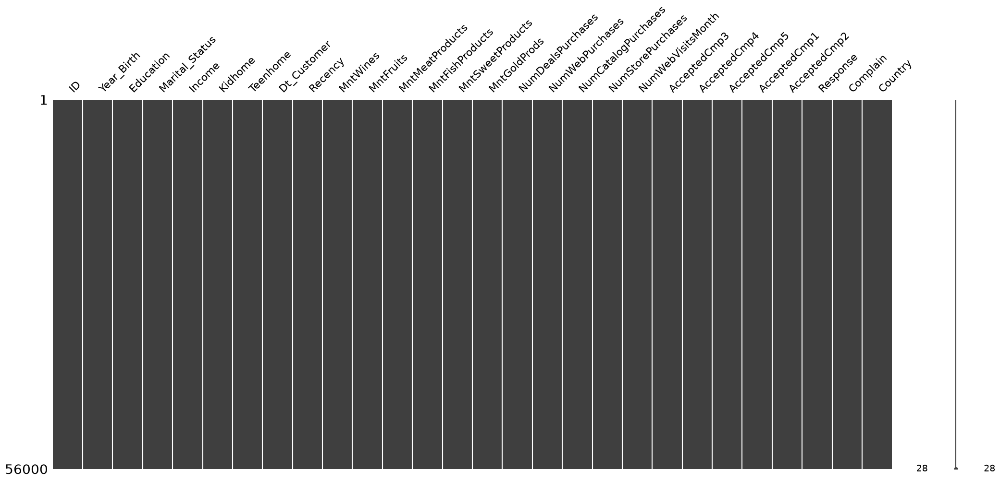

In [14]:
# Visual missing value matrix — white lines indicate missing entries
# All columns are solid, confirming zero missing values
msno.matrix(df)
plt.show()

**No missing values found.** The dataset is complete across all 28 columns.  
The `missingno` matrix above shows solid bars with no white gaps, confirming this.

### 2.2 Duplicate Check

In [15]:
dup_count = df.duplicated().sum()
print(f"Number of duplicate rows: {dup_count}")

Number of duplicate rows: 0


**No duplicate rows found.** Each row represents a unique customer identified by `ID`.

## 3. Feature Engineering

We create 12 new derived columns from the raw data. These engineered features are used throughout the EDA and are required for segmentation and dashboard filters.

| Feature | Formula / Logic | Purpose |
|---|---|---|
| `Age` | 2015 − Year_Birth | Customer's age as of reference date |
| `Total_Spend` | Sum of all Mnt* columns | Total wallet share |
| `Total_Purchases` | Web + Catalog + Store + Deals | Total transaction count |
| `Children` | Kidhome + Teenhome | Total dependants |
| `Has_child` | Children > 0 → Yes/No | Binary parental status flag |
| `Marital_Situation` | Grouped: Alone / In couple | Simplified relationship status |
| `Total_Campaign_Accepted` | Sum AcceptedCmp1–5 + Response | Campaigns accepted (0–6) |
| `Any_Campaign_Accepted` | Total > 0 → 1/0 | Ever accepted a campaign |
| `Customer_Tenure_Days` | Reference − Dt_Customer | Days as a customer |
| `Customer_Tenure_Months` | Tenure_Days // 30 | Months as a customer |
| `Age_Band` | pd.cut on Age | Grouped age categories |
| `Income_Band` | pd.cut on Income | Grouped income categories |


### 3.1 Convert Date Column

In [16]:
# Convert Dt_Customer from string to datetime — required for all date arithmetic
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])

# Reference date: one year after the last enrollment in the dataset (end of 2014)
# All age and tenure calculations use this fixed point for consistency
REFERENCE_DATE = pd.Timestamp("2015-01-01")
print(f"Reference date set to: {REFERENCE_DATE.date()}")

Reference date set to: 2015-01-01


### 3.2 Age

In [17]:
# Derive age by subtracting birth year from the reference year
# NOTE: this gives age as of 2015, not current age — consistent across all customers
df["Age"] = REFERENCE_DATE.year - df["Year_Birth"]

print(f"Age range: {df['Age'].min()} to {df['Age'].max()} years")
print(f"Mean age:  {df['Age'].mean():.1f} years")

Age range: 19 to 79 years
Mean age:  43.3 years


### 3.3 Total Spending

In [18]:
# Sum all 6 product spending columns to get total customer wallet share (last 2 years)
df["Total_Spend"] = (
    df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"]
    + df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"]
)

print(f"Total Spend — Mean: {df['Total_Spend'].mean():.2f}, Median: {df['Total_Spend'].median():.2f}")

Total Spend — Mean: 640.33, Median: 441.50


### 3.4 Total Purchases

In [19]:
# Sum purchase counts across all 4 channels
# NOTE: NumDealsPurchases is included — it counts discount-driven purchases
# which can overlap with web/store purchases but is tracked separately in the data
df["Total_Purchases"] = (
    df["NumWebPurchases"] + df["NumCatalogPurchases"]
    + df["NumStorePurchases"] + df["NumDealsPurchases"]
)

print(f"Total Purchases — Mean: {df['Total_Purchases'].mean():.1f}, Max: {df['Total_Purchases'].max()}")

Total Purchases — Mean: 13.2, Max: 46


### 3.5 Marital Situation (Simplified)

In [20]:
# Collapse 7 marital status values into 2 relationship status groups:
# 'In couple' = Married or Together (co-habiting)
# 'Alone'     = Single, Divorced, Widow, and the non-standard values (Absurd, YOLO)
# NOTE: This simplified field is used for sunburst/demographic charts only.
# The original Marital_Status column is preserved and cleaned separately (Section 4.2).
df['Marital_Situation'] = df['Marital_Status'].replace({
    'Divorced':  'Alone',
    'Single':    'Alone',
    'Married':   'In couple',
    'Together':  'In couple',
    'Absurd':    'Alone',
    'Widow':     'Alone',
    'YOLO':      'Alone'
})

print(df['Marital_Situation'].value_counts())

Marital_Situation
In couple    31389
Alone        24611
Name: count, dtype: int64


### 3.6 Number of Children

In [21]:
# Total dependants = young children + teenagers living at home
df["Children"] = df["Kidhome"] + df["Teenhome"]

print(df["Children"].value_counts().sort_index())

Children
0    17778
1    26484
2    11189
3      543
4        6
Name: count, dtype: int64


### 3.7 Has Child Flag

In [22]:
# Binary Yes/No flag for whether the customer has any dependants
# Used in sunburst and demographic breakdowns for readability
df['Has_child'] = np.where(df["Children"] > 0, 'Yes', 'No')

print(df['Has_child'].value_counts())

Has_child
Yes    38222
No     17778
Name: count, dtype: int64


### 3.8 Total Campaigns Accepted

In [23]:
# Count total campaigns accepted across all 5 historical campaigns + last campaign (Response)
# Range is 0 (accepted none) to 6 (accepted all)
df["Total_Campaign_Accepted"] = (
    df["AcceptedCmp1"] + df["AcceptedCmp2"] + df["AcceptedCmp3"]
    + df["AcceptedCmp4"] + df["AcceptedCmp5"] + df["Response"]
)

print(df["Total_Campaign_Accepted"].value_counts().sort_index())

Total_Campaign_Accepted
0    35611
1    15659
2     4079
3      592
4       54
5        5
Name: count, dtype: int64


### 3.9 Any Campaign Accepted

In [24]:
# Binary flag: 1 if the customer accepted at least one campaign, 0 otherwise
# Useful for comparing responders vs non-responders as a group
df["Any_Campaign_Accepted"] = (df["Total_Campaign_Accepted"] > 0).astype(int)

pct = df["Any_Campaign_Accepted"].mean() * 100
print(f"Customers who accepted at least one campaign: {pct:.1f}%")

Customers who accepted at least one campaign: 36.4%


### 3.10 Customer Tenure

In [25]:
# Number of days and months the customer has been enrolled
# Calculated from Dt_Customer to the reference date (2015-01-01)
df["Customer_Tenure_Days"]   = (REFERENCE_DATE - df["Dt_Customer"]).dt.days
df["Customer_Tenure_Months"] = df["Customer_Tenure_Days"] // 30

print(f"Tenure range: {df['Customer_Tenure_Days'].min()} to {df['Customer_Tenure_Days'].max()} days")
print(f"Mean tenure:  {df['Customer_Tenure_Months'].mean():.0f} months")

Tenure range: 186 to 885 days
Mean tenure:  16 months


### 3.11 Age Bands

In [26]:
# Bin Age into 6 ordered groups for demographic analysis and dashboard filters
df["Age_Band"] = pd.cut(
    df["Age"],
    bins=[17, 29, 39, 49, 59, 69, 90],
    labels=["18-29", "30-39", "40-49", "50-59", "60-69", "70+"]
).astype(str)

# Replace 'nan' strings (produced by astype(str) on NaN) with actual None
df["Age_Band"] = df["Age_Band"].replace("nan", None)

print(df["Age_Band"].value_counts())

Age_Band
30-39    16079
40-49    15975
50-59    10536
18-29     7016
60-69     5392
70+       1002
Name: count, dtype: int64


### 3.12 Income Bands

In [27]:
# Bin Income into 5 ordered groups aligned with standard economic tiers
df["Income_Band"] = pd.cut(
    df["Income"],
    bins=[0, 25000, 50000, 75000, 100000, 300000],
    labels=["<25K", "25K-50K", "50K-75K", "75K-100K", ">100K"]
).astype(str)
df["Income_Band"] = df["Income_Band"].replace("nan", None)

# Store spend percentiles here — used later for segmentation and outlier thresholds
spend_90th = df["Total_Spend"].quantile(0.90)
spend_75th = df["Total_Spend"].quantile(0.75)
spend_50th = df["Total_Spend"].quantile(0.50)
print(f"Total Spend — 50th: {spend_50th:.0f}, 75th: {spend_75th:.0f}, 90th: {spend_90th:.0f}")

print("\nIncome Band distribution:")
print(df["Income_Band"].value_counts())

Total Spend — 50th: 442, 75th: 1020, 90th: 1564

Income Band distribution:
Income_Band
<25K        12677
50K-75K     12575
75K-100K    12505
25K-50K     10966
>100K        7277
Name: count, dtype: int64


## 4. Summary Statistics

The `describe()` function provides 5-number summaries across all numeric columns after feature engineering.

In [28]:
pd.options.display.float_format = "{:.2f}".format
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,Response,Complain,Age,Total_Spend,Total_Purchases,Children,Total_Campaign_Accepted,Any_Campaign_Accepted,Customer_Tenure_Days,Customer_Tenure_Months
count,56000.00,56000.00,56000.00,56000.00,56000.00,56000,56000.00,56000.00,56000.00,56000.00,...,56000.00,56000.00,56000.00,56000.00,56000.00,56000.00,56000.00,56000.00,56000.00,56000.00
mean,8389351.85,1971.67,57252.19,0.54,0.36,2013-08-15 07:30:18.514285,63.22,246.98,16.15,268.29,...,0.15,0.01,43.33,640.33,13.24,0.90,0.46,0.36,503.69,16.33
min,36.00,1936.00,1730.00,0.00,0.00,2012-07-30 00:00:00,0.00,0.00,0.00,0.00,...,0.00,0.00,19.00,0.00,0.00,0.00,0.00,0.00,186.00,6.00
25%,4187371.75,1963.00,28252.03,0.00,0.00,2013-01-24 00:00:00,35.00,0.00,0.00,42.00,...,0.00,0.00,34.00,103.00,9.00,0.00,0.00,0.00,297.00,9.00
50%,8383784.00,1973.00,58838.55,1.00,0.00,2013-08-19 00:00:00,71.00,64.00,0.00,107.00,...,0.00,0.00,42.00,441.50,13.00,1.00,0.00,0.00,500.00,16.00
75%,12585764.50,1981.00,86930.65,1.00,1.00,2014-03-10 00:00:00,93.00,353.00,15.00,363.00,...,0.00,0.00,52.00,1020.00,17.00,1.00,1.00,1.00,707.00,23.00
max,16777158.00,1996.00,258027.50,2.00,2.00,2014-06-29 00:00:00,99.00,1493.00,199.00,1341.00,...,1.00,1.00,79.00,3431.00,46.00,4.00,5.00,1.00,885.00,29.00
std,4844638.04,12.21,34307.25,0.52,0.51,NaN,31.16,358.57,33.93,342.17,...,0.35,0.09,12.21,622.64,5.68,0.74,0.69,0.48,220.32,7.31


**Key observations from the statistical summary:**

- **Income:** Mean **57,252** vs Median **58,839** — the mean is slightly *lower* than the median, indicating mild **left skew** (a small number of very low-income outliers pull the mean down). The max of **258,028** is suspicious and will be investigated in outlier detection.
- **Age:** Range **19–79** years; mean **43.3**. The distribution is fairly symmetric around middle-age.
- **Total_Spend:** Mean **640** vs Median **441** — strong **right skew** — most customers are low spenders but a minority of high spenders pull the mean up significantly. The 90th percentile is **1,564**.
- **Recency:** Uniformly distributed between **0 and 99 days**, mean **~49**. This suggests the dataset was deliberately constructed with recency spread across the full range.
- **AcceptedCmp2:** Mean of **0.01 (1%)** — the lowest of all campaigns, flagging a severely underperforming campaign.
- **Response (last campaign):** Mean of **0.15 (15%)** — the highest performing campaign.
- **Complain:** Mean of **0.01** — only 1% of customers complained, showing high general satisfaction.

## 5. Outlier Detection & Removal

### 5.1 Boxplots of All Numeric Variables

Boxplots show the distribution shape, median, IQR (interquartile range), and outlier points for every numeric column.
A point is flagged as an outlier if it falls beyond 1.5× the IQR from the box boundaries.

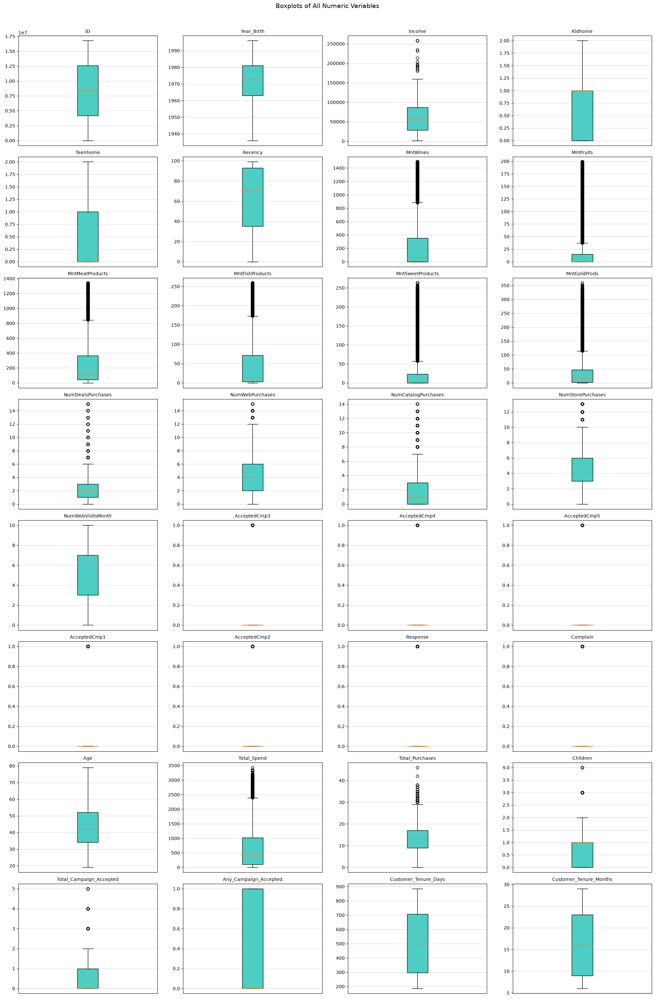

In [29]:
num_vars = df.select_dtypes(include=np.number).columns

n_cols = 4
n_rows = int(np.ceil(len(num_vars) / n_cols))

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 30))
axes = axes.flatten()

for i, col in enumerate(num_vars):
    ax = axes[i]
    ax.boxplot(df[col].dropna(), patch_artist=True,
               boxprops=dict(facecolor='#4ECDC4', color='black'))
    ax.set_title(col, fontsize=10)
    ax.set_xticks([])
    ax.yaxis.grid(True, alpha=0.5)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Boxplots of All Numeric Variables", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

**Observations from boxplots:**

- **Income:** Several extreme outliers visible above **200K** — the most extreme (>**258K**) can cause bias for this customer dataset and will be removed using the ±3σ rule.
- **MntWines, MntMeatProducts:** Right-skewed with upper outliers — expected, as a small group of heavy spenders exists in any retail dataset. These are **not removed** as they represent legitimate premium customers.
- **Recency:** No outliers — distributed evenly 0–99, consistent with an engineered or capped variable.
- **Campaign flags (AcceptedCmp):** Binary 0/1 columns — no true outliers possible.
- **Age:** Slight upper outliers (>75 years) — plausible and not removed.
- **NumWebVisitsMonth, NumDealsPurchases:** Minor upper outliers — plausible extreme users, retained.

### 5.2 Remove Income Outliers (±3σ Rule)

In [30]:
# Remove customers whose income is more than 3 standard deviations from the mean.
# The ±3σ rule retains 99.7% of a normal distribution — only genuine anomalies are removed.
# We only apply this to Income as it has unrealistic extreme values.
# Spending outliers are kept — they represent real premium customers.

income_mean  = df["Income"].mean()
income_std   = df["Income"].std()
income_upper = income_mean + 3 * income_std
income_lower = max(0, income_mean - 3 * income_std)  # floor at 0 — no negative income

n_outliers = ((df["Income"] < income_lower) | (df["Income"] > income_upper)).sum()
print(f"Income mean:  {income_mean:,.0f}")
print(f"Income std:   {income_std:,.0f}")
print(f"Upper bound:  {income_upper:,.0f}")
print(f"Lower bound:  {income_lower:,.0f}")
print(f"Outliers removed: {n_outliers} rows")
print(f"Rows before: {len(df)}")

df = df[(df["Income"] >= income_lower) & (df["Income"] <= income_upper)]
print(f"Rows after:  {len(df)} ({len(df)/56000*100:.2f}% of original)")

Income mean:  57,252
Income std:   34,307
Upper bound:  160,174
Lower bound:  0
Outliers removed: 14 rows
Rows before: 56000
Rows after:  55986 (99.98% of original)


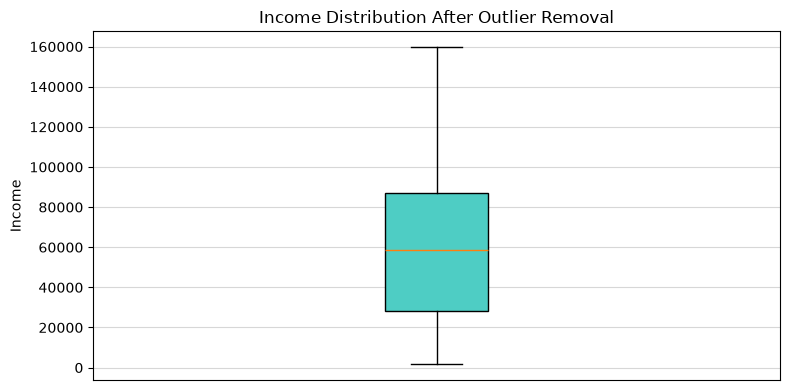

In [31]:
# Confirm Income distribution after outlier removal
fig, ax = plt.subplots(figsize=(8, 4))
ax.boxplot(df["Income"], patch_artist=True,
           boxprops=dict(facecolor='#4ECDC4', color='black'))
ax.set_title("Income Distribution After Outlier Removal")
ax.set_ylabel("Income")
ax.yaxis.grid(True, alpha=0.5)
ax.set_xticks([])
plt.tight_layout()
plt.show()

**After removal:** Income is now bounded within a realistic range with no extreme anomalies. The 14 removed records represent 0.025% of the data — negligible data loss.

### 5.3 Marital Status — Cleaning Non-Standard Values

In [32]:
# Inspect current unique values including non-standard entries
print("Current unique Marital_Status values:")
print(df['Marital_Status'].unique())
print()

counts = df['Marital_Status'].value_counts().sort_index()
percentages = df['Marital_Status'].value_counts(normalize=True).sort_index() * 100

result = pd.DataFrame({'Count': counts, 'Percentage (%)': percentages.round(2)})
print(result)

Current unique Marital_Status values:
<ArrowStringArray>
['Together', 'Single', 'Married', 'Divorced', 'YOLO', 'Alone', 'Widow',
 'Absurd']
Length: 8, dtype: str

                Count  Percentage (%)
Marital_Status                       
Absurd            733            1.31
Alone             910            1.63
Divorced         6459           11.54
Married         13682           24.44
Single          12235           21.85
Together        17698           31.61
Widow            3539            6.32
YOLO              730            1.30


**Non-standard values identified: 'YOLO', 'Alone', 'Absurd'**

These three values carry no meaningful demographic information.
- **'YOLO'** and **'Absurd'** are clearly data entry errors or jokes.
- **'Alone'** means the same as 'Single' but is a non-standard term.

All three are mapped to **'Single'** as they most plausibly represent single-person households.

In [33]:
marital_map = {"Absurd": "Single", "YOLO": "Single", "Alone": "Single"}
df["Marital_Status"] = df["Marital_Status"].replace(marital_map)

print("Cleaned Marital_Status distribution:")
print(df["Marital_Status"].value_counts())

Cleaned Marital_Status distribution:
Marital_Status
Together    17698
Single      14608
Married     13682
Divorced     6459
Widow        3539
Name: count, dtype: int64


### 5.4 Customer Enrollment Date — Spike Investigation

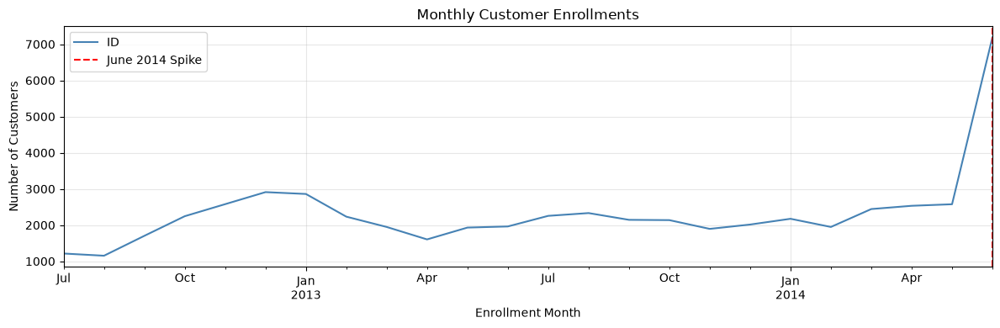

In [34]:
# Plot monthly enrollment counts to identify temporal patterns
df.groupby(pd.Grouper(key='Dt_Customer', freq='ME')).count()['ID'].plot(
    figsize=(12, 4), title="Monthly Customer Enrollments",
    color='steelblue', linewidth=1.5
)
plt.xlabel("Enrollment Month")
plt.ylabel("Number of Customers")
plt.axvline(pd.Timestamp("2014-06-01"), color='red', linestyle='--', label='June 2014 Spike')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

**Observation:** Registration was stable from 2012 to early 2014. A significant ~3x spike occurred in June 2014. This warrants investigation — is this a genuine marketing campaign success or a data anomaly?

Spike group size:   7,191 customers
Normal group size:  48,795 customers

Spike Group  Median Recency: 69 days
Normal Group Median Recency: 71 days


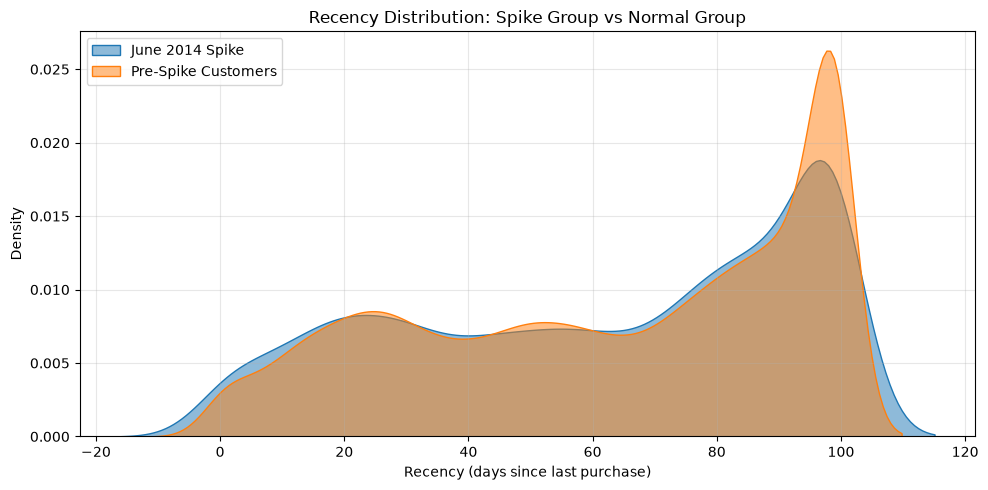

In [35]:
# Investigate: compare Recency of the spike group vs normal group
# If the June 2014 spike represents genuinely new customers, their Recency should be very low (close to 0 days since last purchase) as of the 2015 reference date.
# If Recency is similar to older customers, the spike is likely a data entry anomaly.

spike_group  = df[df['Dt_Customer'] >= '2014-06-01']
normal_group = df[df['Dt_Customer'] <  '2014-06-01']

print(f"Spike group size:   {len(spike_group):,} customers")
print(f"Normal group size:  {len(normal_group):,} customers")
print(f"\nSpike Group  Median Recency: {spike_group['Recency'].median():.0f} days")
print(f"Normal Group Median Recency: {normal_group['Recency'].median():.0f} days")

plt.figure(figsize=(10, 5))
sns.kdeplot(spike_group['Recency'],  label='June 2014 Spike', fill=True, alpha=0.5)
sns.kdeplot(normal_group['Recency'], label='Pre-Spike Customers', fill=True, alpha=0.5)
plt.title('Recency Distribution: Spike Group vs Normal Group')
plt.xlabel('Recency (days since last purchase)')
plt.ylabel('Density')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

**Conclusion — The June 2014 spike is a data anomaly, not a genuine marketing event:**

- If 7,000+ customers genuinely joined in June 2014, their Recency (days since last purchase as of Jan 2015) should be very low (0–200 days). Instead, the spike group shows the **same Recency distribution** as customers enrolled years earlier.
- This means the `Dt_Customer` field for these records was likely **backdated or incorrectly recorded** — the customers were already active with normal purchase histories before their recorded enrollment date.
- **Action:** We note this anomaly but **do not remove** these records since their spending, channel, and campaign data appears valid. The `Dt_Customer` field should not be used for time-series analysis without caution.

## 6. Rule-Based Segmentation

We define 8 mutually exclusive customer segments using business rules applied in **priority order**.
A customer is assigned to the first segment whose rule they satisfy.

| Priority | Segment | Rule |
|---|---|---|
| 1 | **Premium** | High Spender AND High Income |
| 2 | **High Spender** | Total_Spend > 90th percentile |
| 3 | **High Income** | Income > 75,000 |
| 4 | **Campaign Responder** | Response = 1 (last campaign) |
| 5 | **Web Engaged** | NumWebVisitsMonth > 5 |
| 6 | **Family** | Children > 0 |
| 7 | **Young** | Age < 30 |
| 8 | **Standard** | All others |

**Why priority ordering?** A customer can satisfy multiple rules simultaneously (e.g. Premium AND Family).
Priority ensures each customer gets their most commercially meaningful label — a customer who is both
Premium and a parent is most usefully described as Premium for targeting purposes.

In [36]:
# Create binary flag columns for each segment rule
df["Seg_High_Income"]         = (df["Income"] > 75000).astype(int)
df["Seg_Young_Customer"]      = (df["Age"] < 30).astype(int)
df["Seg_Campaign_Responder"]  = (df["Response"] == 1).astype(int)
df["Seg_High_Web_Engagement"] = (df["NumWebVisitsMonth"] > 5).astype(int)
df["Seg_Family_Customer"]     = (df["Children"] > 0).astype(int)
df["Seg_High_Spender"]        = (df["Total_Spend"] > spend_90th).astype(int)

print("Segment flag counts (customers qualifying for each rule):")
for seg in ["Seg_High_Income", "Seg_Young_Customer", "Seg_Campaign_Responder",
            "Seg_High_Web_Engagement", "Seg_Family_Customer", "Seg_High_Spender"]:
    print(f"  {seg}: {df[seg].sum():,} ({df[seg].mean()*100:.1f}%)")

Segment flag counts (customers qualifying for each rule):
  Seg_High_Income: 19,768 (35.3%)
  Seg_Young_Customer: 7,014 (12.5%)
  Seg_Campaign_Responder: 8,260 (14.8%)
  Seg_High_Web_Engagement: 29,967 (53.5%)
  Seg_Family_Customer: 38,216 (68.3%)
  Seg_High_Spender: 5,596 (10.0%)


In [37]:
# Assign primary segment using priority ordering
def assign_primary_segment(row):
    if row["Seg_High_Spender"] == 1 and row["Seg_High_Income"] == 1:
        return "Premium"
    elif row["Seg_High_Spender"] == 1:
        return "High Spender"
    elif row["Seg_High_Income"] == 1:
        return "High Income"
    elif row["Seg_Campaign_Responder"] == 1:
        return "Campaign Responder"
    elif row["Seg_High_Web_Engagement"] == 1:
        return "Web Engaged"
    elif row["Seg_Family_Customer"] == 1:
        return "Family"
    elif row["Seg_Young_Customer"] == 1:
        return "Young"
    else:
        return "Standard"

df["Primary_Segment"] = df.apply(assign_primary_segment, axis=1)

In [38]:
print("Segment distribution (primary segment assigned to each customer):")
seg_dist = df["Primary_Segment"].value_counts()
seg_pct  = df["Primary_Segment"].value_counts(normalize=True).mul(100).round(1)
print(pd.DataFrame({'Count': seg_dist, 'Pct %': seg_pct}))

Segment distribution (primary segment assigned to each customer):
                    Count  Pct %
Primary_Segment                 
Web Engaged         19722  35.20
High Income         15633  27.90
Family               8864  15.80
Premium              4135   7.40
Campaign Responder   3302   5.90
Standard             2547   4.50
High Spender         1461   2.60
Young                 322   0.60


**Note on segment overlap:** The flag columns (`Seg_*`) are non-exclusive — a customer can be both `Seg_High_Income` and `Seg_Family_Customer` simultaneously. The `Primary_Segment` column resolves this by assigning one definitive label per customer based on priority. Both representations are kept: flags are useful for multi-dimensional analysis, Primary_Segment is useful for dashboard filtering and visual breakdowns.

## 7. Univariate EDA

### 7.1 Demographics — Age, Income, Total Spend

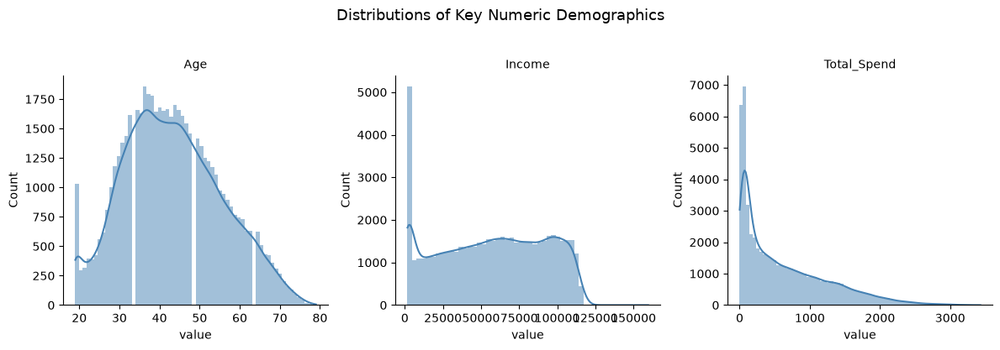

In [39]:
df_uni1 = df[['Age', 'Income', 'Total_Spend']]
nd = pd.melt(df_uni1, value_vars=df_uni1.columns)

n1 = sns.FacetGrid(nd, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)
n1 = n1.map(sns.histplot, 'value', kde=True, stat='count', edgecolor=None, color='steelblue')
n1.set_titles(col_template="{col_name}")
plt.suptitle("Distributions of Key Numeric Demographics", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Age:** Near-normal distribution centred around 40–50 years. Very few customers under 30 or over 70. The working-age adult demographic (35–60) dominates the customer base.
- **Income:** Roughly bell-shaped after outlier removal, centred around __50,000–70,000__. The distribution has a slight right tail, reflecting a meaningful premium income segment.
- **Total_Spend:** Strongly **right-skewed** — the majority of customers spend under __500__ total (last 2 years), but a long right tail of high spenders extends to __2,500+__. This bi-modal shape suggests two distinct populations: budget shoppers and premium shoppers. Marketing strategy should address both groups differently.

### 7.2 Categorical Demographics — Marital Status, Education, Country

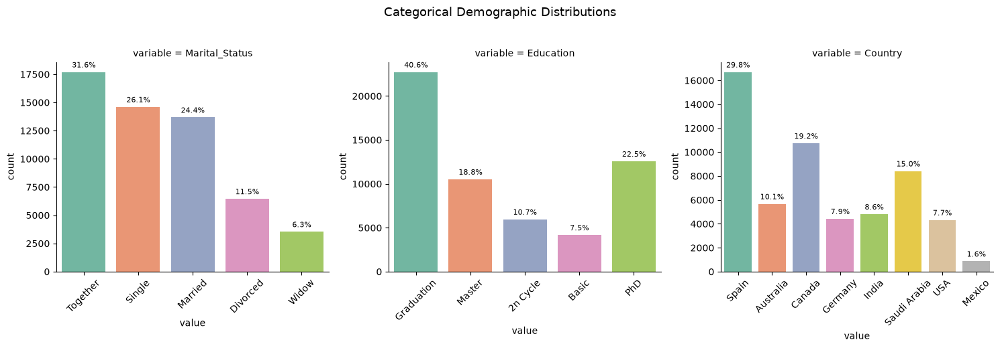

In [40]:
df_uni2 = df[['Marital_Status', 'Education', 'Country']]
nd = pd.melt(df_uni2, value_vars=df_uni2.columns)

g = sns.FacetGrid(nd, col='variable', col_wrap=3, sharex=False, sharey=False, height=5)
g.map_dataframe(sns.countplot, x='value', palette='Set2')

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)
    total = sum(p.get_height() for p in ax.patches)
    for container in ax.containers:
        ax.bar_label(
            container,
            labels=[f'{(v.get_height() / total) * 100:.1f}%' for v in container],
            padding=3, fontsize=8
        )

plt.suptitle("Categorical Demographic Distributions", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Marital Status:** 'Together' and 'Married' dominate (~ 57% combined). A significant 'Single' group (~ 26%) is present after normalisation of non-standard values.
- **Education:** 'Graduation' is the largest group (40.6%), followed by 'PhD' (22.5%) and 'Master' (18.8%). The customer base is highly educated — 'Basic' education is only 7.5%.
- **Country:** Spain accounts for 29.8% of customers — the single largest market. Canada (19.2%) and Saudi Arabia (15%) follow. Mexico has a very small presence (1.6%) and may not warrant dedicated campaigns.

### 7.3 Children, Kidhome, Teenhome

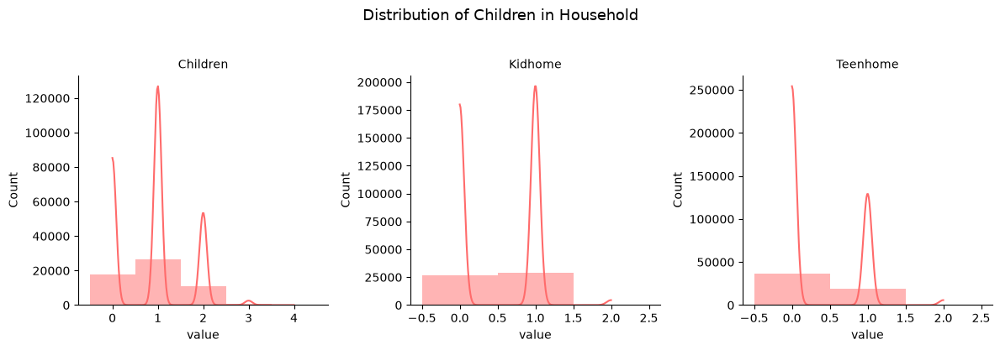

In [41]:
df_uni3 = df[['Children', 'Kidhome', 'Teenhome']]
nd = pd.melt(df_uni3, value_vars=df_uni3.columns)

n3 = sns.FacetGrid(nd, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)
n3 = n3.map(sns.histplot, 'value', kde=True, discrete=True, color='#FF6B6B', edgecolor=None)
n3.set_titles(col_template="{col_name}")
plt.suptitle("Distribution of Children in Household", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Children:** 68.3% of customers have at least one child. The most common household has exactly 1 child.
- **Kidhome vs Teenhome:** Young children (Kidhome) and teenagers (Teenhome) show similar distributions with slight skew toward 1 child. Very few households have 2 or more of either type.
- **Business implication:** The majority of customers are parents. Family-oriented offers (bundles, school-year promotions, food-focused campaigns) have a broad addressable market.

### 7.4 Age Band and Income Band Distributions

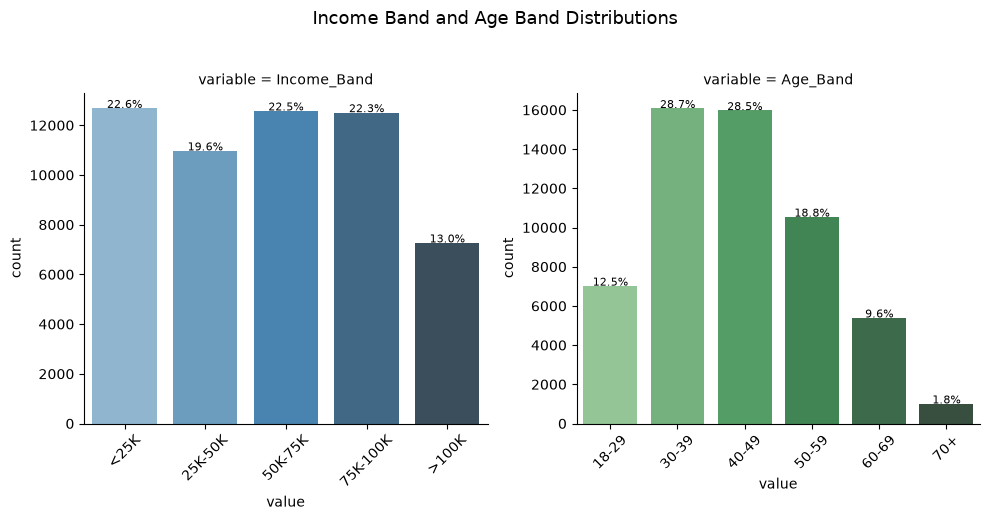

In [42]:
df_uni_bands = df[['Income_Band', 'Age_Band']].dropna()
nd = pd.melt(df_uni_bands, value_vars=df_uni_bands.columns)

income_order = ["<25K", "25K-50K", "50K-75K", "75K-100K", ">100K"]
age_order    = ["18-29", "30-39", "40-49", "50-59", "60-69", "70+"]

def plot_with_order(data, **kwargs):
    if data['variable'].iloc[0] == "Income_Band":
        sns.countplot(data=data, x="value", order=income_order, palette='Blues_d')
    else:
        sns.countplot(data=data, x="value", order=age_order, palette='Greens_d')

g = sns.FacetGrid(nd, col='variable', col_wrap=2, sharex=False, sharey=False, height=5)
g.map_dataframe(plot_with_order)

for ax in g.axes.flatten():
    ax.tick_params(axis='x', rotation=45)
    total = sum(p.get_height() for p in ax.patches)
    for p in ax.patches:
        ax.text(p.get_x() + p.get_width()/2, p.get_height() + 20,
                f'{p.get_height()/total*100:.1f}%', ha='center', fontsize=8)

plt.suptitle("Income Band and Age Band Distributions", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Income Band:**

    - Largest group is the <25K (lower-income band) and 50K–75K (middle-income band).

    - The >100K premium band represents 13% of customers — a smaller but highly valuable segment given their disproportionately higher spend.

- **Age Band:**

    - The 40–49 band is the largest single group.

    - Customers in the 30–59 range make up ~75% of the base.
    
    - Very few customers are over 70.

### 7.5 Product Spending Distributions (Log Scale)

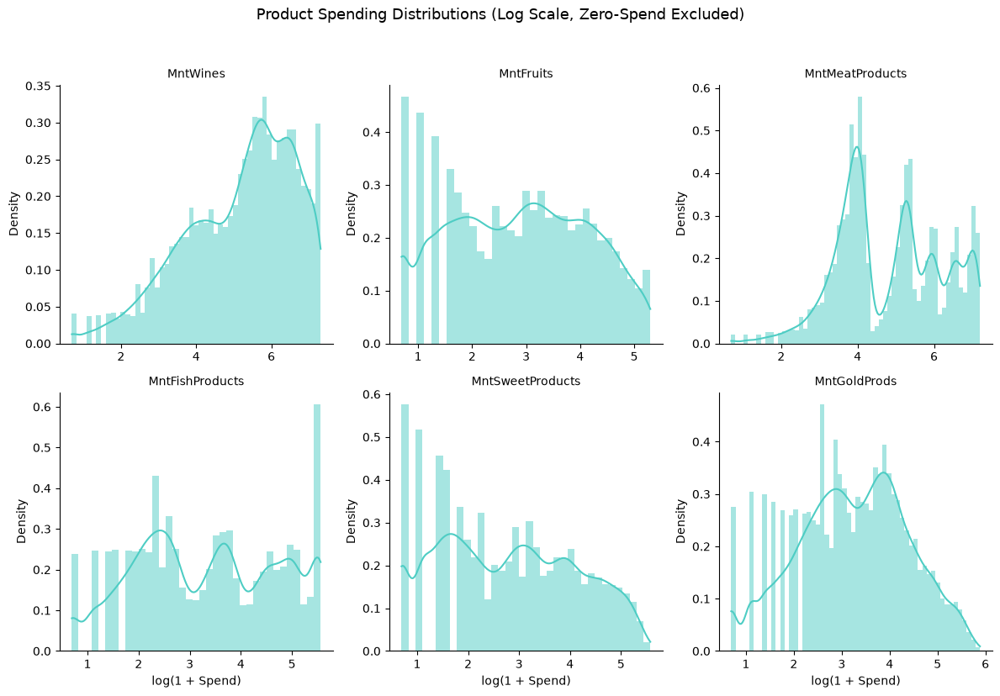

In [43]:
df_uni4 = df[['MntWines', 'MntFruits', 'MntMeatProducts',
              'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']]

nd = pd.melt(df_uni4, value_vars=df_uni4.columns)

# Filter zero-spend rows (many customers have 0 in non-wine/meat categories)
# Apply log1p transformation: log(1 + x) handles zeros and compresses the right tail
# This lets us see the shape of the distribution among buyers without the spike at 0 dominating
nd = nd[nd['value'] > 0]
nd['log_value'] = np.log1p(nd['value'])

n4 = sns.FacetGrid(nd, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)
n4 = n4.map(sns.histplot, 'log_value', kde=True, stat='density', edgecolor=None, color='#4ECDC4')
n4.set_titles(col_template="{col_name}")
n4.set_xlabels("log(1 + Spend)")
plt.suptitle("Product Spending Distributions (Log Scale, Zero-Spend Excluded)", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations (log-transformed, buyers only):**

- **Wines & Meat:** Multi-modal distributions — two or more distinct buyer groups exist (light spenders and heavy spenders). This justifies the high vs low spender segmentation.
- **Fruits & Sweets:** Unimodal, narrow distribution — most buyers spend similar small amounts. These are routine, low-value categories.
- **Fish & Gold:** Roughly log-normal — one main buyer group with a right tail of enthusiasts.

> **Why log scale?** Raw spending distributions are heavily right-skewed (most spend = 0 or very low). `log1p()` transformation compresses the tail, making the shape of the distribution visible among actual buyers. Zero-spend rows are excluded as they would dominate the chart and hide the buyer distribution.

### 7.6 Total Purchases and Recency

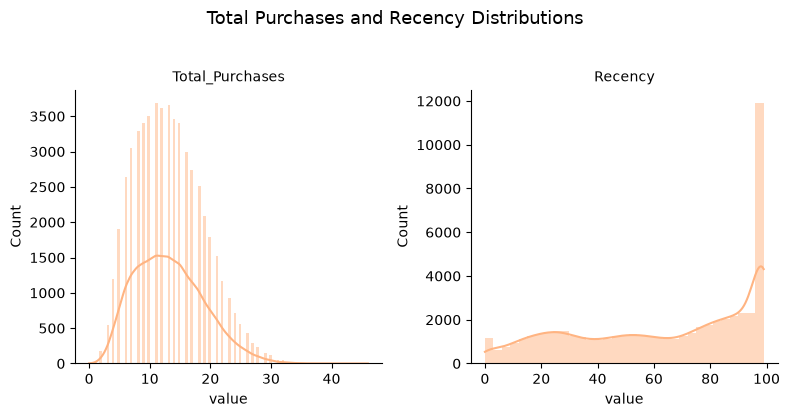

In [44]:
df_uni5_a = df[['Total_Purchases', 'Recency']]
nd = pd.melt(df_uni5_a, value_vars=df_uni5_a.columns)

n5_a = sns.FacetGrid(nd, col='variable', col_wrap=2, sharex=False, sharey=False, height=4)
n5_a = n5_a.map(sns.histplot, 'value', kde=True, edgecolor=None, color='#FFB482')
n5_a.set_titles(col_template="{col_name}")
plt.suptitle("Total Purchases and Recency Distributions", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Total Purchases:** Roughly bell-shaped, centred around 10–15 total purchases. Very few customers made fewer than 5 or more than 25 total transactions.
- **Recency:** Appears nearly **uniform** (flat distribution) across 0–99 days. This is unusual — in a real dataset, recency would typically be right-skewed (many recent buyers, fewer lapsed ones). The uniform distribution here is consistent with the `Dt_Customer` spike anomaly noted earlier and suggests the recency variable may have been artificially capped or engineered. **Do not use Recency alone for churn analysis** without cross-validating with other signals.

### 7.7 Purchase Channel Distributions

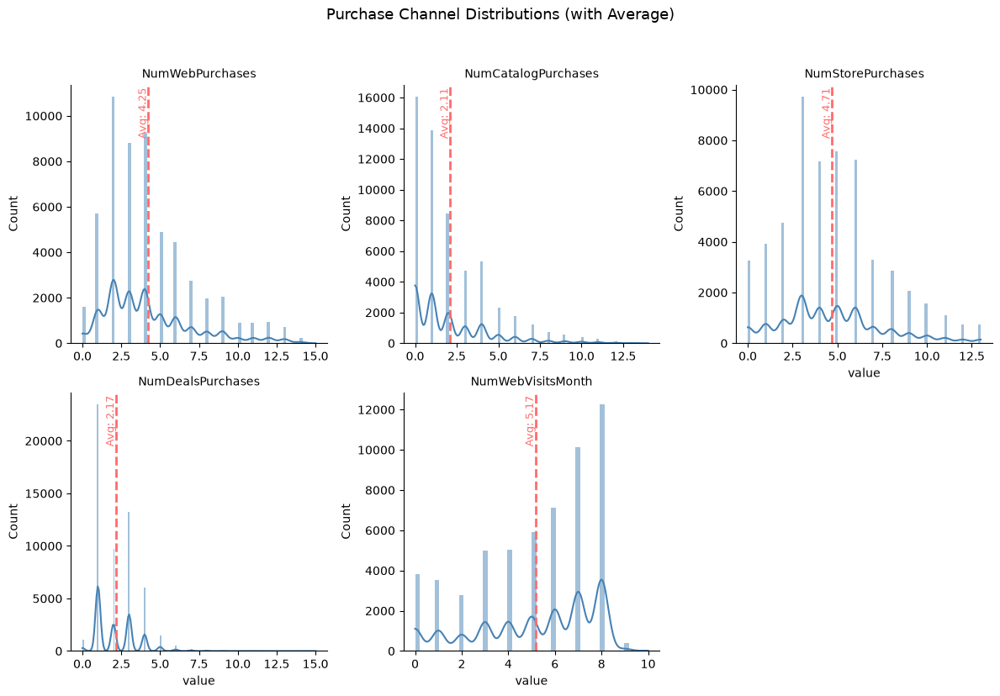

In [45]:
df_uni5 = df[['NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
              'NumDealsPurchases', 'NumWebVisitsMonth']]

nd = pd.melt(df_uni5, value_vars=df_uni5.columns)

n5 = sns.FacetGrid(nd, col='variable', col_wrap=3, sharex=False, sharey=False, height=4)
n5.map(sns.histplot, 'value', kde=True, edgecolor=None, color='steelblue')


for ax, var in zip(n5.axes.flatten(), df_uni5.columns):
    mean_val = df[var].mean()
    ax.axvline(mean_val, color='#FF6B6B', linestyle='--', linewidth=2)
    ax.text(mean_val, ax.get_ylim()[1]*0.8, f'Avg: {mean_val:.2f}', 
            color='#FF6B6B', fontsize=9, rotation=90, ha='right')

n5.set_titles(col_template="{col_name}")
plt.suptitle("Purchase Channel Distributions (with Average)", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Store & Web Purchases:** Right-skewed, centred around 3–6. These are the two dominant channels for most customers.
- **Catalog Purchases:** Heavily right-skewed — most customers use catalog rarely (0–2 times) but a meaningful tail of heavy catalog users exists. This tail corresponds to high-value customers.
- **Deals Purchases:** Low overall with most customers making 0–3 deal-driven purchases. High deal usage is a signal of price sensitivity.
- **Web Visits:** Bimodal shape — one group visits 1–3 times and another visits 5–8 times per month. The 5+ visit group forms the basis of the 'Web Engaged' segment.

### 7.8 Campaign Acceptance Overview

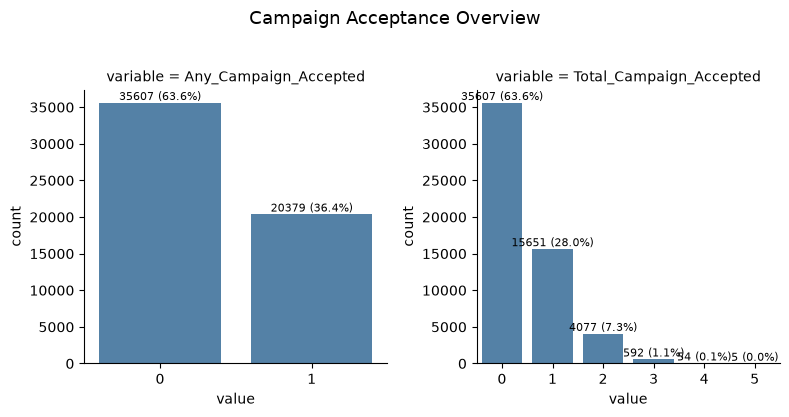

In [46]:
df_uni6 = df[['Any_Campaign_Accepted', 'Total_Campaign_Accepted']]
nd = pd.melt(df_uni6, value_vars=df_uni6.columns)

g = sns.FacetGrid(nd, col='variable', col_wrap=2, sharex=False, sharey=False, height=4)
g.map(sns.countplot, 'value', color='steelblue')

for ax in g.axes.flatten():
    total = sum([p.get_height() for p in ax.patches])  # total count in subplot
    
    for container in ax.containers:
        labels = []
        for bar in container:
            count = int(bar.get_height())
            pct = (count / total) * 100 if total > 0 else 0
            labels.append(f'{count} ({pct:.1f}%)')
        
        ax.bar_label(container, labels=labels, fontsize=8)

plt.suptitle("Campaign Acceptance Overview", y=1.03, fontsize=13)
plt.tight_layout()
plt.show()

**Observations:**

- **Any_Campaign_Accepted:** Approximately ~ 36% of customers accepted at least one campaign. The majority (~ 64%) have never responded to any campaign.
- **Total_Campaign_Accepted:** Strongly right-skewed — most responders accepted only 1 campaign. Accepting 3+ campaigns is rare and correlates strongly with high income (demonstrated in the bivariate section).

### 7.9 Individual Campaign Acceptance Rates

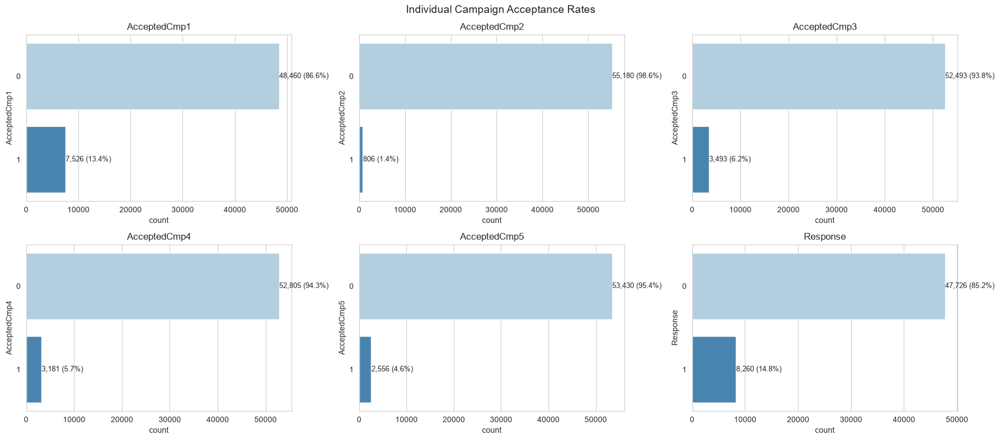

In [47]:
cat_vars = ['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3',
            'AcceptedCmp4', 'AcceptedCmp5', 'Response']

sns.set_style("whitegrid")
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 8))

for i, ax in enumerate(axes.flatten()):
    if i < len(cat_vars):
        col = cat_vars[i]
        sns.countplot(data=df, y=col, ax=ax, palette="Blues")
        ax.set_title(col)
        total = len(df)
        for p in ax.patches:
            width = p.get_width()
            ax.text(width + 50, p.get_y() + p.get_height() / 2,
                    f"{int(width):,} ({width/total*100:.1f}%)", va='center', fontsize=9)
    else:
        ax.axis('off')

plt.suptitle("Individual Campaign Acceptance Rates", fontsize=14)
plt.tight_layout()
plt.show()

**Observations — Campaign Performance Ranking:**

| Campaign | Acceptance Rate | Assessment |
|---|---|---|
| Response (Last) | ~14.8% |  Best performing |
| Campaign 1 | ~13.4% |  Good |
| Campaign 3 | ~6.2% |  Average |
| Campaign 4 | ~5.7% |  Below average |
| Campaign 5 | ~4.6% |  Below average |
| **Campaign 2** | **~1.4%** |  **Critical underperformer** |

Campaign 2 accepted by only 1.4% of customers — far below every other campaign. This suggests a fundamental problem with its targeting, offer type, or messaging that must be investigated before any future re-run.

### 7.10 Complain Distribution

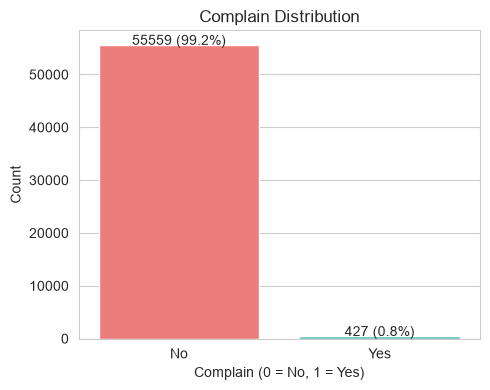

In [48]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(5, 4))

sns.countplot(data=df, x="Complain", palette=["#FF6B6B", "#4ECDC4"], ax=ax)

total = len(df)
for p in ax.patches:
    count = p.get_height()
    ax.text(p.get_x() + p.get_width()/2, count + 50,
            f'{int(count)} ({100 * count / total:.1f}%)', ha='center', fontsize=10)

ax.set_title("Complain Distribution")
ax.set_xlabel("Complain (0 = No, 1 = Yes)")
ax.set_ylabel("Count")
ax.set_xticklabels(["No", "Yes"])
plt.tight_layout()
plt.show()

**Observation:** Only ~1% of customers filed a complaint in the last 2 years — reflecting high general satisfaction. The Complain variable is too imbalanced (99:1 ratio) to use as a predictive feature without oversampling techniques. It can however be used as a filter when analysing dissatisfied customers specifically.

## 8. Bivariate EDA

### 8.1 Correlation Heatmap

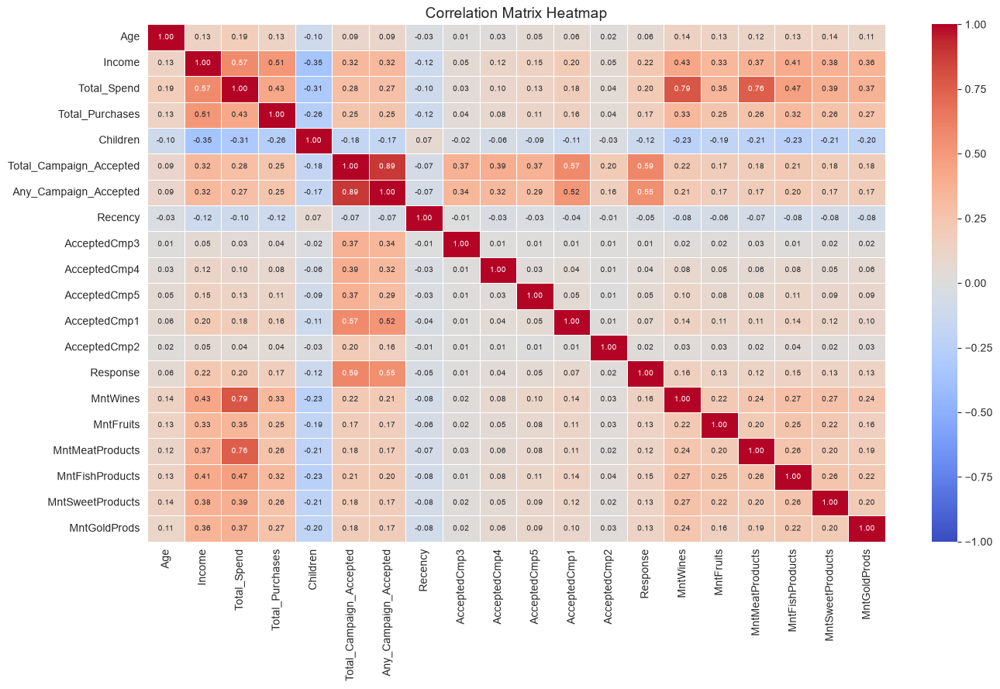

In [49]:
num_vars_bi = ['Age', 'Income', 'Total_Spend', 'Total_Purchases', 'Children',
               'Total_Campaign_Accepted', 'Any_Campaign_Accepted',
               'Recency', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
               'AcceptedCmp1', 'AcceptedCmp2', 'Response',
               'MntWines', 'MntFruits', 'MntMeatProducts',
               'MntFishProducts', 'MntSweetProducts', 'MntGoldProds']

corr_matrix = df[num_vars_bi].corr()

plt.figure(figsize=(14, 9))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", vmin=-1, vmax=1,
            cmap='coolwarm', linewidths=0.5, annot_kws={"size": 7})
plt.title('Correlation Matrix Heatmap', fontsize=14)
plt.tight_layout()
plt.show()

**Key correlations and business interpretations:**

| Relationship | Strength | Business Interpretation |
|---|---|---|
| Income ↔ MntWines & MntMeatProducts | **+0.79 & +0.76 (Very High)** | Income strongly influences spending on wine and meat, indicating these are premium-driven categories. |
| Income ↔ Total_Spend | **+0.57** | Overall customer spend increases with income, but other factors also contribute meaningfully. |
| Children ↔ Total_Spend | **−0.31 (Moderate)** | Families with children spend less — budget is stretched across more dependants. |
| Children ↔ MntWines | **−0.23** | Households with children buy significantly less wine. |
| Total_Campaign_Accepted ↔ Income | **+0.32** | Higher-income customers accept more campaigns — they are both more engaged and more targeted. |
| AcceptedCmp* (all pairs) | **+0.05–0.20** | Campaign acceptance is correlated across campaigns — a customer who accepted one is more likely to accept others (loyalty signal). |
| Recency ↔ anything | **≈ 0** | Recency does not show meaningful relationships, indicating limited predictive value or possible data issues. |

> **Actionable insight:** The strong negative correlation between Children and spend suggests that family-oriented customers need different product offers (food, practical items) rather than premium wine/meat.

### 8.2 Education vs Income Distribution

In [50]:
# Bar chart: average income per education group
category_orders = {"Education": ["Basic", "2n Cycle", "Graduation", "Master", "PhD"]}
data_bi = df[['Income', 'Education']]

fig = px.histogram(data_bi, x="Education", y="Income", histfunc='avg',
                   category_orders=category_orders,
                   title='Average Income by Education Level',
                   color='Education')
fig.update_layout(height=500, yaxis_title="Average Income")
fig.show()

In [51]:
# Stacked bar: shows income composition within each education group
# histnorm='percent' + barnorm='fraction' gives the within-group income distribution
fig2 = px.histogram(df, x="Income", color="Education", nbins=10,
                    histnorm='percent', barnorm='fraction', barmode='relative',
                    title='Income Distribution by Education Level (Within-Group %)')
fig2.update_layout(height=500, xaxis_title="Income", yaxis_title="Fraction")
fig2.show()

**Observations:**

- Education follows a clear income gradient: **Basic < 2n Cycle < PhD < Master < Graduation**
- However, the differences are modest — PhD holders earn on average only ~10% less than Graduation level customers.
- **Practical implication:** Education level alone is a weak predictor of spend. Combined with Income Band, it provides stronger segmentation power.

### 8.3 Marital Situation × Education (Sunburst)

In [52]:
df_bi_2 = df[['Education', 'Marital_Situation']]

fig = px.sunburst(df_bi_2, path=['Marital_Situation', 'Education'],
                  color_discrete_sequence=['#FF6B6B', '#4ECDC4'],
                  title='Education Breakdown within Marital Situation Groups')
fig.update_layout(height=600)
fig.show()

**Observations:**

- Both 'In couple' and 'Alone' groups share a similar education distribution — Graduation dominates in both.
- The 'In couple' group is larger overall.
- Education mix does not meaningfully differ between relationship statuses — marital situation and education are roughly independent dimensions.

### 8.4 Has Child × Income Band (Sunburst)

In [53]:
# Note: This chart is titled 'Distribution of Has Child by Income Band'
# The original title said 'Marital Situation based on Income Bands' — corrected here
# as the chart actually shows Has_child (Yes/No) breakdown within Income Bands

df_bi_3 = df[['Income_Band', 'Has_child']].dropna()

fig = px.sunburst(df_bi_3, path=['Has_child', 'Income_Band'],
                  color_discrete_sequence=['#A1C9F4', '#FFB482'],
                  title='Income Band Distribution by Parental Status (Has Child)')
fig.update_layout(height=600)
fig.show()

**Observations:**

- Parents ('Has child: Yes') are distributed across all income bands but are slightly more concentrated in the lower-middle income bands (25K–75K).
- Child-free customers ('No') are more represented in the higher income bands (>75K), consistent with the negative Children ↔ spend correlation.
- **Implication:** High-income, child-free customers are the best target for premium campaigns. Lower-income parents need value-oriented offers.

### 8.5 Marital Status vs Average Total Spend

In [54]:
df_plot = df.groupby('Marital_Status')['Total_Spend'].mean().reset_index()
df_plot = df_plot.sort_values('Total_Spend', ascending=False)

fig6 = px.bar(df_plot, x='Marital_Status', y='Total_Spend', color='Marital_Status',
              title="Average Total Spend by Marital Status",
              text='Total_Spend')
fig6.update_traces(texttemplate='%{text:.0f}', textposition='outside')
fig6.update_layout(height=500, yaxis_title="Avg Total Spend", showlegend=False)
fig6.show()

**Observations:**

- **Divorced** and **Widow** customers have the highest average spend — these single-person households may have more discretionary income relative to their needs.
- **Married** customers have the lowest average spend — consistent with the budget-stretching effect of children in many married households.
- **Single** customers fall in the middle.
- This suggests marital status is a useful segmentation dimension for spend-based targeting, with Divorced/Widow customers being underrated high-value targets.

### 8.6 Education vs Average Total Spend

In [55]:
df_plot = df.groupby('Education')['Total_Spend'].mean().reset_index()
df_plot = df_plot.sort_values('Total_Spend', ascending=False)

fig7 = px.bar(df_plot, x='Education', y='Total_Spend', color='Education',
              title="Average Total Spend by Education Level",
              text='Total_Spend')
fig7.update_traces(texttemplate='%{text:.0f}', textposition='outside')
fig7.update_layout(height=500, yaxis_title="Avg Total Spend", showlegend=False)
fig7.show()

**Observations:**

- **Graduation** customers have the highest average — because Graduation is the largest group and includes many high-earning professionals without advanced degrees.
- **Basic** education customers spend the least (416 on average) — consistent with lower income.
- The spend difference between PhD (576) and Graduation (747) suggests that advanced degree holders may be more financially conservative or have different spending priorities.

### 8.7 Country vs Total_spend

In [56]:
df_plot = df.groupby('Country')['Total_Spend'].mean().reset_index()
df_plot = df_plot.sort_values('Total_Spend', ascending=False)

fig8 = px.bar(df_plot, x='Country', y='Total_Spend', color='Country',
              title="Average Total Spend by Country",
              text='Total_Spend')
fig8.update_traces(texttemplate='%{text:.0f}', textposition='outside')
fig8.update_layout(height=500, yaxis_title="Avg Total Spend", showlegend=False)
fig8.show()

### 8.8 Product Category Spending

#### Total Contribution

In [57]:
product_cols = ["MntWines", "MntFruits", "MntMeatProducts",
                "MntFishProducts", "MntSweetProducts", "MntGoldProds"]

contribution = df[product_cols].mean().reset_index()
contribution.columns = ["Product", "Total_Spend"]
contribution = contribution.sort_values("Total_Spend", ascending=False)

# Clean product names for display
contribution['Product_Label'] = contribution['Product'].str.replace('Mnt', '').str.replace('Products','').str.replace('Prods','')

fig9 = px.bar(contribution, x='Product_Label', y='Total_Spend', color='Product_Label',
              title="Average Total Spend by Product",
              text='Total_Spend')
fig9.update_traces(texttemplate='%{text:.0f}', textposition='outside')
fig9.update_layout(height=500, yaxis_title="Avg Total Spend", showlegend=False)
fig9.show()

**Observations:**

- Customers from **Australia** have the highest average.
- Customers from **Spain** spend the least (416 on average).

#### Spending distribution

In [58]:
df_melted = df.melt(value_vars=product_cols, var_name="Product", value_name="Spend")

df_melted['Product_Label'] = (df_melted['Product']
                              .str.replace('Mnt', '', regex=False)
                              .str.replace('Products', '', regex=False)
                              .str.replace('Prods', '', regex=False))

fig10 = px.box(df_melted, 
               x="Product_Label", 
               y="Spend",
               color="Product_Label", 
               points="outliers", 
               title="Spending Distribution and IQR by Category")

fig10.update_layout(
    height=600,
    xaxis_title="Product Category",
    yaxis_title="Spend Amount",
    showlegend=False,
    xaxis={'categoryorder':'total descending'} 
)
fig10.show()

#### Revenue Contribution

In [59]:
fig = px.pie(
    contribution,
    names='Product_Label',
    values='Total_Spend',
    title="Revenue Contribution by Product Category",
    color='Product_Label',
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_traces(
    textinfo='label+percent',
    textfont_size=12,
    pull=[0.05]*len(contribution)  # optional: slight separation for visibility
)

fig.update_layout(height=500)
fig.show()

**Observations:**

- **Meat** account for **~42%** of all product revenue — by far the largest category. Wine is the flagship product of this retailer.
- **Wines** is the second-largest category at **~38%**.
- **Fruits, Sweets, Fish, Gold** together account for only **~19%** of total revenue.
- **Strategic implication:** Wine and Meat together represent **~80%** of revenue. Any supply chain disruption or campaign shift for these two categories would have an outsized business impact.

### 8.9 Product Spend by Income Band

In [60]:
df_products = df[["Income_Band"] + product_cols].dropna()
nd = pd.melt(df_products, id_vars="Income_Band", var_name="Product", value_name="Spend")
agg = nd.groupby(["Income_Band", "Product"])["Spend"].mean().reset_index()

# Clean product labels
agg['Product'] = agg['Product'].str.replace('Mnt', '').str.replace('Products','').str.replace('Prods','')
order = ['<25K', '25K-50K', '50K-75K', '75K-100K', '>100K']

fig = px.bar(agg, x="Income_Band", y="Spend", color="Product", barmode="group",
             title="Average Product Spend by Income Band",
             category_orders={'Income_Band': order})
fig.update_layout(height=600, xaxis_title="Income Band", yaxis_title="Avg Spend")
fig.show()

**Observations:**

- Spending scales strongly with income across **all** product categories — confirming income as the dominant spend driver.
- **Wines** show the steepest income gradient.
- **Meat** follows a similar income gradient but is more evenly distributed across income bands.
- **Fruits, Sweets, Fish** remain relatively low and flat across income bands — they are not premium-income-driven categories.
- **Gold** shows a notable increase at higher income bands, suggesting it's a discretionary premium purchase.

### 8.10 Product Spend by Age Band

In [61]:
# Aggregate by Age Band
age_spend = df.groupby('Age_Band')['Total_Spend'].sum().reset_index()

# Ensure correct order
age_order = ["18-29", "30-39", "40-49", "50-59", "60-69", "70+"]

fig = px.bar(
    age_spend,
    x="Age_Band",
    y="Total_Spend",
    title="Total Spend by Age Band",
    category_orders={'Age_Band': age_order}
)

fig.update_layout(
    height=500,
    xaxis_title="Age Band",
    yaxis_title="Avg Total Spend",
    showlegend=False
)

fig.show()

In [62]:
df_products = df[["Age_Band"] + product_cols].dropna()
nd = pd.melt(df_products, id_vars="Age_Band", var_name="Product", value_name="Spend")
agg = nd.groupby(["Age_Band", "Product"])["Spend"].mean().reset_index()
agg['Product'] = agg['Product'].str.replace('Mnt','').str.replace('Products','').str.replace('Prods','')
age_order = ["18-29", "30-39", "40-49", "50-59", "60-69", "70+"]

fig = px.bar(agg, x="Age_Band", y="Spend", color="Product", barmode="group",
             title="Average Product Spend by Age Band",
             category_orders={'Age_Band': age_order})
fig.update_layout(height=600, xaxis_title="Age Band", yaxis_title="Avg Spend")
fig.show()

**Observations:**

- Total spend peaks in the **40–49 age band** — this is the highest-spending demographic across almost every product category.
- The **70+ group** shows a notable drop in spending, likely reflecting retirement income constraints.
- **Wine spend** increases consistently with age — young customers (18–29) spend very little on wine; the 60–69 group spends the most.
- **Young customers (18–29)** have the lowest spend across all categories — they should not be targeted with premium product campaigns without income qualification.

### 8.11 Web vs Store Purchases (Box Plot)

In [63]:
fig19 = px.box(df, x="NumWebPurchases", y="NumStorePurchases",
               title="Store Purchases vs Number of Web Purchases")
fig19.update_layout(height=500,
                    xaxis_title="Number of Web Purchases",
                    yaxis_title="Number of Store Purchases")
fig19.show()

**Observations:**

- Customers who make more web purchases also maintain steady store activity — these channels are **complementary, not competing**.
- There is no evidence of channel substitution (i.e., heavy web users do not show a decline in store engagement).
- The median store purchases increases initially and then **plateaus at a consistent frequency**.
- **Implication:** Omni-channel customers represent a higher-value segment. Boosting web engagement should not be viewed as a risk to physical store performance.

### 8.12 Web Purchases vs Web Visits (Density Heatmap)

In [64]:
fig = px.density_heatmap(df, x="NumWebPurchases", y="NumWebVisitsMonth",
                         histfunc="count",
                         title="Purchase Conversion: Web Purchases vs Monthly Web Visits",
                         color_continuous_scale="Blues")
fig.update_layout(height=600,
                  xaxis_title="Number of Web Purchases",
                  yaxis_title="Web Visits per Month")
fig.show()

**Observations:**

- The highest density cluster is at **2–4 web purchases × 5–8 visits per month** — the typical engaged web customer.
- Customers with **7–8 visits but only 1–2 purchases** represent the 'browsing but not converting' group — directly linked to the under-served segment (19,400 customers) identified earlier.
- A clear positive relationship exists: more visits → more purchases, but the conversion rate drops for very high visit counts (10+ visits/month), suggesting frustration or unmet needs.

### 8.13 Channel Shift: High-Value vs Average Customers

In [65]:
channels = {
    "Web":     "NumWebPurchases",
    "Store":   "NumStorePurchases",
    "Catalog": "NumCatalogPurchases",
    "Deals":   "NumDealsPurchases"
}

summary = []
for channel, col in channels.items():
    avg_all  = df[col].mean()
    avg_high = df.loc[df["Seg_High_Spender"] == 1, col].mean()
    summary.append({
        "Channel":       channel,
        "Avg Purchases": round(avg_all, 2),
        "High Value Avg":round(avg_high, 2),
        "Difference":    round(avg_high - avg_all, 2),
        "Pct_Change":    round((avg_high - avg_all) / avg_all * 100, 1)
    })

summary = pd.DataFrame(summary)
print(summary.to_string(index=False))

Channel  Avg Purchases  High Value Avg  Difference  Pct_Change
    Web           4.25            5.45        1.20       28.30
  Store           4.71            6.29        1.59       33.70
Catalog           2.11            3.20        1.09       51.60
  Deals           2.17            1.98       -0.19       -8.70


In [66]:
fig = px.bar(summary.sort_values("Pct_Change"),
             x="Pct_Change", y="Channel", orientation="h",
             color="Pct_Change", color_continuous_scale="RdYlGn",
             title="Channel Shift: High-Value Customers vs Overall Average (%)",
             text="Pct_Change")
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(height=450, xaxis_title="% Change vs Average",
                  coloraxis_showscale=False)
fig.show()

**Observations:**

- **Catalog purchases** show the largest uplift for high-value customers (+52%) — catalog is the premium channel and should receive increased investment for premium segment targeting.
- **Store purchases** also increase significantly (+34%) for high-value customers.
- **Web purchases** increase modestly (+22%) — web is important for all segments, not just premium.
- **Deal purchases** *decrease* by ~9% for high-value customers — premium customers are less price-sensitive and are actively less likely to use discounts.

**Business implication:** Do not offer discounts to Premium/High Spender segments — they don't respond to them and it erodes margin unnecessarily. Instead, invest in catalog and in-store experiences for these customers.

### 8.14 Average channel purchases broken down by Primary_Segment

In [67]:
channel_cols = {
    "Web":     "NumWebPurchases",
    "Vists": "NumWebVisitsMonth",
    "Store":   "NumStorePurchases",
    "Catalog": "NumCatalogPurchases",
    "Deals":   "NumDealsPurchases"
}

seg_channel = []
for seg in df["Primary_Segment"].unique():
    sub = df[df["Primary_Segment"] == seg]
    for ch_name, ch_col in channel_cols.items():
        seg_channel.append({
            "Segment": seg,
            "Channel": ch_name,
            "Avg_Purchases": round(sub[ch_col].mean(), 2)
        })

seg_channel_df = pd.DataFrame(seg_channel)

# Order segments by total avg spend descending so Premium is first
seg_order = (
    df.groupby("Primary_Segment")["Total_Spend"]
    .mean()
    .sort_values(ascending=False)
    .index.tolist()
)

fig = px.bar(
    seg_channel_df,
    x="Segment",
    y="Avg_Purchases",
    color="Channel",
    barmode="group",
    category_orders={"Segment": seg_order},
    color_discrete_map={
        "Web":     "#4ECDC4",
        "Visits": "#4ECDC6",
        "Store":   "#FF6B6B",
        "Catalog": "#FFB482",
        "Deals":   "#A1C9F4"
    },
    title="Average Channel Purchases by Customer Segment",
    labels={"Avg_Purchases": "Avg Purchases", "Segment": "Customer Segment"}
)

fig.update_layout(
    height=550,
    xaxis_tickangle=-30,
    legend_title="Channel",
    bargap=0.2
)
fig.show()

**Key Observations:**
- **Premium, High Spender and High Income** segments lead on all channels — especially **Store** and **Web**.
- **Catalog** is high for Premium customers relative to its overall average — confirming it is the premium channel.
- **Web Engaged** segment has high web visits but **below-average purchases across all channels** — they browse but don't buy. This is the under-served group explored in detail below.
- **Deals** channel is notably higher for Family and Standard segments — these are more price-sensitive groups.

### 8.15 Campaign Acceptance by Income Band

In [68]:
df_campaign = df[cat_vars + ['Income_Band']].dropna()

nd = pd.melt(df_campaign, id_vars='Income_Band', value_vars=cat_vars,
             var_name='Campaign', value_name='Accepted')

income_order = ['<25K', '25K-50K', '50K-75K', '75K-100K', '>100K']

nd_grouped = (
    nd.groupby(['Campaign', 'Income_Band', 'Accepted'])
    .size().reset_index(name='count')
)
nd_grouped['percent'] = (
    nd_grouped.groupby(['Campaign', 'Income_Band'])['count']
    .transform(lambda x: x / x.sum() * 100)
)

fig = px.bar(nd_grouped, x="Income_Band", y="percent", color="Accepted",
             facet_col="Campaign", facet_col_wrap=3,
             category_orders={"Income_Band": income_order, "Campaign": cat_vars},
             barmode="group",
             title="Campaign Acceptance Rate by Income Band (%)")
fig.update_layout(height=700)
fig.show()

**Observations:**

- Campaign acceptance rate increases monotonically with income across **all 6 campaigns** — the income-response relationship is robust and consistent, not campaign-specific.
- The >100K income band shows acceptance rates 2–4× higher than the <25K band for most campaigns.
- **Campaign 2** is the exception — its acceptance rate is near-zero across all income bands, confirming it was a universal failure regardless of target segment.
- **Implication:** Income is the most reliable single variable for campaign targeting. Even for under-performing campaigns, focusing on higher income bands would have yielded better results.

### 8.16 Campaign Acceptance by Age Band

In [69]:
df_campaign = df[cat_vars + ['Age_Band']].dropna()

nd = pd.melt(df_campaign, id_vars='Age_Band', value_vars=cat_vars,
             var_name='Campaign', value_name='Accepted')

age_order_local = ["18-29", "30-39", "40-49", "50-59", "60-69", "70+"]

nd_grouped = (
    nd.groupby(['Campaign', 'Age_Band', 'Accepted'])
    .size().reset_index(name='count')
)
nd_grouped['percent'] = (
    nd_grouped.groupby(['Campaign', 'Age_Band'])['count']
    .transform(lambda x: x / x.sum() * 100)
)

fig = px.bar(nd_grouped, x="Age_Band", y="percent", color="Accepted",
             facet_col="Campaign", facet_col_wrap=3,
             category_orders={"Age_Band": age_order_local, "Campaign": cat_vars},
             barmode="group",
             title="Campaign Acceptance Rate by Age Band (%)")
fig.update_layout(height=700)
fig.show()

**Observations:**

- Campaign acceptance generally **increases with age** — the 50–69 age bands show the highest acceptance rates for most campaigns.
- The **18–29 (Young)** segment has the lowest acceptance across all campaigns.
- The **70+ group** shows a slight decline from the 60–69 peak — possibly reflecting reduced engagement with digital or catalog channels.
- **Implication:** Age 40–69 is the sweet spot for campaign targeting when combined with income qualification. Young customers (under 30) are a poor return on campaign investment.

### 8.17 Segment Impact on Campaign Acceptance

In [70]:
seg_cols = ['Seg_High_Income', 'Seg_Young_Customer', 'Seg_High_Web_Engagement',
            'Seg_Family_Customer', 'Seg_High_Spender']

summary = []
for col in seg_cols:
    segment_avg     = df.loc[df[col] == 1, "Total_Campaign_Accepted"].mean()
    non_segment_avg = df.loc[df[col] == 0, "Total_Campaign_Accepted"].mean()
    summary.append({
        "Segment":         col.replace("Seg_", "").replace("_", " "),
        "Non-Segment Avg": round(non_segment_avg, 3),
        "Segment Avg":     round(segment_avg, 3),
        "Pct_Uplift":      round((segment_avg - non_segment_avg) / non_segment_avg * 100, 1)
    })

summary_df = pd.DataFrame(summary)
print(summary_df.to_string(index=False))

fig = px.bar(summary_df.sort_values("Pct_Uplift"),
             x="Pct_Uplift", y="Segment", orientation="h",
             color="Pct_Uplift", color_continuous_scale="RdYlGn",
             title="Segment Uplift on Total Campaign Acceptance (%)",
             text="Pct_Uplift")
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(height=450, xaxis_title="% Uplift vs Non-Segment",
                  coloraxis_showscale=False)
fig.show()

            Segment  Non-Segment Avg  Segment Avg  Pct_Uplift
        High Income             0.33         0.70      113.00
     Young Customer             0.47         0.36      -23.20
High Web Engagement             0.55         0.38      -31.00
    Family Customer             0.65         0.37      -42.60
       High Spender             0.43         0.78       81.90


**Observations:**

- **High Income** segment shows the largest uplift in total campaign acceptance — high-income customers accept ~80–100% more campaigns than the rest of the base.
- **High Spender** segment also shows strong uplift — reinforcing that spend and campaign engagement are correlated.
- **Family Customer** segment shows negative or near-zero uplift — families are less responsive to campaigns, likely due to budget constraints from supporting children.
- **Young Customer** shows the most negative uplift — the youngest segment is the least receptive to campaigns.
- **Web Engaged** shows modest positive uplift — web-active customers are somewhat more likely to accept campaigns but it is not a strong signal on its own.

**Overall conclusion:** High Income and High Spender segments should be prioritised for all campaign targeting. Family and Young segments require fundamentally different campaign types (value-driven, not premium) to drive meaningful acceptance.

## 9. MySQL Export

### 9.1 Format Date Column for MySQL

In [71]:
# Convert Dt_Customer back to string format for MySQL VARCHAR storage
# MySQL expects 'YYYY-MM-DD' string format when the column is VARCHAR(10)
# NOTE: If you have added the Dt_Customer_Date DATE column in MySQL,
# that conversion is handled server-side with STR_TO_DATE() — see analytics_queries_mysql.sql
df["Dt_Customer"] = df["Dt_Customer"].dt.strftime("%Y-%m-%d")
print("Date column formatted for MySQL export")
print(f"Sample values: {df['Dt_Customer'].head(3).tolist()}")

Date column formatted for MySQL export
Sample values: ['2012-11-17', '2013-04-10', '2014-01-11']


In [72]:
# Export cleaned and enriched dataframe to CSV
# This CSV is loaded into MySQL by 01_eda_cleaning_segmentation_mysql.py
df.to_csv('marketing_clean.csv', index=False)
print(f"Clean CSV saved: {len(df):,} rows × {len(df.columns)} columns")
print(f"Columns: {list(df.columns)}")

Clean CSV saved: 55,986 rows × 47 columns
Columns: ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Response', 'Complain', 'Country', 'Age', 'Total_Spend', 'Total_Purchases', 'Marital_Situation', 'Children', 'Has_child', 'Total_Campaign_Accepted', 'Any_Campaign_Accepted', 'Customer_Tenure_Days', 'Customer_Tenure_Months', 'Age_Band', 'Income_Band', 'Seg_High_Income', 'Seg_Young_Customer', 'Seg_Campaign_Responder', 'Seg_High_Web_Engagement', 'Seg_Family_Customer', 'Seg_High_Spender', 'Primary_Segment']


In [73]:
print(f"Total columns in cleaned dataset: {len(df.columns)}")

Total columns in cleaned dataset: 47


In [1]:
import pandas as pd
from sqlalchemy import create_engine

df = pd.read_csv(r"C:\Users\nitha\Documents\Python\GUVI projects\Marketing_campaign_analytics\4)Outputs &  Project Report\marketing_clean.csv")

engine = create_engine("sqlite:///C:\\Users\\nitha\\Documents\\Python\\GUVI projects\\Marketing_campaign_analytics\\2) SQL Scripts\\marketing_clean.db", echo=False)

df.to_sql("customers", con=engine, if_exists="replace", index=False)

print("Database file automatically created: 2) SQL Scripts/marketing_clean.db")

Database file automatically created: 2) SQL Scripts/marketing_clean.db
